# Pneumonia Detection using CNN Deep Learning

## MileStone 1
- Pre-Processing,-Data-Visualisation,-EDA-and-Model-Building
- Exploring-the-given-Data-files,-classes-and-images-of-different-classes
- Imports
- Load-images
- Load-Labels
- Load-Classes
- Show-bounding-box-on-the-image-to-identify-pneumonia
- Dealing-with-missing-values
- Get-Target-Labels-and-Classes-into-one-dataset
- Visualisation-of-different-classes
- Show-image-of-class-'No-Lung-Opacity-/-Not-Normal
- Show-image-of-class-'Normal'
- Show-image-of-class-'Lung-Opacity'
- Show-images-with-multiple-bounding-boxes-as-applicable
- Analysis-from-the-visualisation-of-different-classes

## MileStone 2
- Build-model

### Milestone 1
#### Exploring the given Data files, classes and images of different classes.
- Imports

#### This code imports various Python libraries for data analysis and visualization.
- numpy and pandas are used for working with numerical arrays and dataframes.
- matplotlib and seaborn are used for creating plots and charts.
- gc, glob, and os are standard Python libraries for memory management and working with files and directories.
- cv2 is a library for computer vision and image processing.
- pydicom is a library for reading medical image data in the DICOM format.
- PIL is a library for image processing and manipulation.
- The last two lines of code use the warnings library to suppress warning messages that may occur during runtime.

In [76]:
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
import seaborn as sns
import gc
import glob
import os
import cv2
import pydicom
from PIL import Image

import warnings
warnings.simplefilter(action = 'ignore')

- Load Files

#### The two lines of code read CSV files into Pandas DataFrames.
- pd.read_csv() is a function in the pandas library used for reading CSV files and converting them to DataFrame objects.
- The first line reads a CSV file named 'stage_2_detailed_class_info.csv' located in the 'dataset' folder and assigns the resulting DataFrame object to detailed_df.
- The second line reads a CSV file named 'stage_2_train_labels.csv' located in the 'dataset' folder and assigns the resulting DataFrame object to train_df.
- detailed_df contains detailed class information for the training set, while train_df contains the label data for training the machine learning models.

In [2]:
detailed_df = pd.read_csv('dataset/stage_2_detailed_class_info.csv')
train_df = pd.read_csv('dataset/stage_2_train_labels.csv')

#### These two lines of code print the shapes of the two Pandas DataFrames.
- detailed_df.shape returns a tuple containing the number of rows and columns in the detailed_df DataFrame, and this tuple is printed to the console.
- train_df.shape returns a tuple containing the number of rows and columns in the train_df DataFrame, and this tuple is also printed to the console.

In [3]:
print(detailed_df.shape)
print(train_df.shape)

(30227, 2)
(30227, 6)


In [4]:
print("Data of Detailed df:\n\n", detailed_df.head())
print("\nData of Train df:\n\n", train_df.head())

Data of Detailed df:

                               patientId                         class
0  0004cfab-14fd-4e49-80ba-63a80b6bddd6  No Lung Opacity / Not Normal
1  00313ee0-9eaa-42f4-b0ab-c148ed3241cd  No Lung Opacity / Not Normal
2  00322d4d-1c29-4943-afc9-b6754be640eb  No Lung Opacity / Not Normal
3  003d8fa0-6bf1-40ed-b54c-ac657f8495c5                        Normal
4  00436515-870c-4b36-a041-de91049b9ab4                  Lung Opacity

Data of Train df:

                               patientId      x      y  width  height  Target
0  0004cfab-14fd-4e49-80ba-63a80b6bddd6    NaN    NaN    NaN     NaN       0
1  00313ee0-9eaa-42f4-b0ab-c148ed3241cd    NaN    NaN    NaN     NaN       0
2  00322d4d-1c29-4943-afc9-b6754be640eb    NaN    NaN    NaN     NaN       0
3  003d8fa0-6bf1-40ed-b54c-ac657f8495c5    NaN    NaN    NaN     NaN       0
4  00436515-870c-4b36-a041-de91049b9ab4  264.0  152.0  213.0   379.0       1


- Merging the data tables detailed_df and train_df

- These lines of code manipulate the two DataFrames (train_df and detailed_df) by concatenating them and dropping duplicate rows. Finally, the resulting DataFrame is printed to the console.

In [5]:
df = pd.concat([train_df,detailed_df["class"]],axis=1,sort=False)
df = df.drop_duplicates()
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30227 entries, 0 to 30226
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   patientId  30227 non-null  object 
 1   x          9555 non-null   float64
 2   y          9555 non-null   float64
 3   width      9555 non-null   float64
 4   height     9555 non-null   float64
 5   Target     30227 non-null  int64  
 6   class      30227 non-null  object 
dtypes: float64(4), int64(1), object(2)
memory usage: 1.6+ MB


In [6]:
df.isnull().sum()

patientId        0
x            20672
y            20672
width        20672
height       20672
Target           0
class            0
dtype: int64

#### Distribution of classes

- The following output shows that the nearly 2/3 of the patients do not have pneumonia (with target value = 0) and 1/3 of the patients have pneumonia (with target value =1)

In [120]:
pd.pivot_table(df,index=["Target"], values=['patientId'], aggfunc='count')

,patientId
Target,
0,20672
1,9555


- Distribution of patients in each class There are 9555 patients in the category 'Lung Opacity' and 11821 in 'No Lung Opacity / Not Normal' category and 8851 are in Normal category

In [8]:
pd.pivot_table(df,index=["class"], values=['patientId'], aggfunc='count')

,patientId
class,
Lung Opacity,9555
No Lung Opacity / Not Normal,11821
Normal,8851


- The classes "No Lung Opacity / Not Normal", "Normal", and "Lung Opacity" are in the proportion of 39%, 29% and 32% respectively

<AxesSubplot:ylabel='count'>

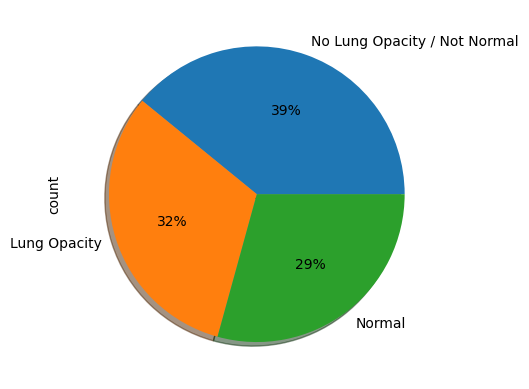

In [9]:
df["class"].value_counts().plot(kind='pie',autopct='%1.0f%%', shadow=True, subplots=False)

- It is also clear from the below output that the patients who do not have pnuemonia do not have the bounding box coordinates

In [10]:
pd.pivot_table(df,index=["Target"], aggfunc='count')

,class,height,patientId,width,x,y
Target,,,,,,
0,20672,0,20672,0,0,0
1,9555,9555,9555,9555,9555,9555


- Count of patients having single row and more than single rows

In [11]:
df['patientId'].value_counts().value_counts()

count
1    23286
2     3266
3      119
4       13
Name: count, dtype: int64

- Patients who do not have pneumonia has only one record in the table

In [12]:
df[df['Target'] == 0]['patientId'].value_counts().value_counts()

count
1    20672
Name: count, dtype: int64

<AxesSubplot:xlabel='class', ylabel='count'>

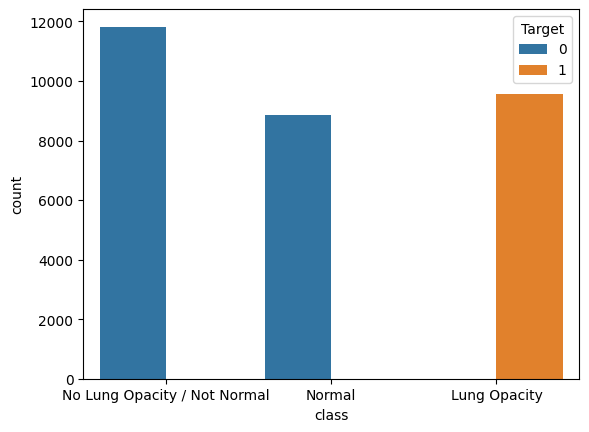

In [13]:
sns.countplot(x = 'class', hue = 'Target', data = df)

- Preprocessing - Filling the null values

In [14]:
df.fillna(0.0)

,patientId,x,y,width,height,Target,class
0,0004cfab-14fd-4e49-80ba-63a80b6bddd6,0.0,0.0,0.0,0.0,0,No Lung Opacity / Not Normal
1,00313ee0-9eaa-42f4-b0ab-c148ed3241cd,0.0,0.0,0.0,0.0,0,No Lung Opacity / Not Normal
2,00322d4d-1c29-4943-afc9-b6754be640eb,0.0,0.0,0.0,0.0,0,No Lung Opacity / Not Normal
3,003d8fa0-6bf1-40ed-b54c-ac657f8495c5,0.0,0.0,0.0,0.0,0,Normal
4,00436515-870c-4b36-a041-de91049b9ab4,264.0,152.0,213.0,379.0,1,Lung Opacity
...,...,...,...,...,...,...,...
30222,c1ec14ff-f6d7-4b38-b0cb-fe07041cbdc8,185.0,298.0,228.0,379.0,1,Lung Opacity
30223,c1edf42b-5958-47ff-a1e7-4f23d99583ba,0.0,0.0,0.0,0.0,0,Normal
30224,c1f6b555-2eb1-4231-98f6-50a963976431,0.0,0.0,0.0,0.0,0,Normal
30225,c1f7889a-9ea9-4acb-b64c-b737c929599a,570.0,393.0,261.0,345.0,1,Lung Opacity


- Correlation between height and width variables

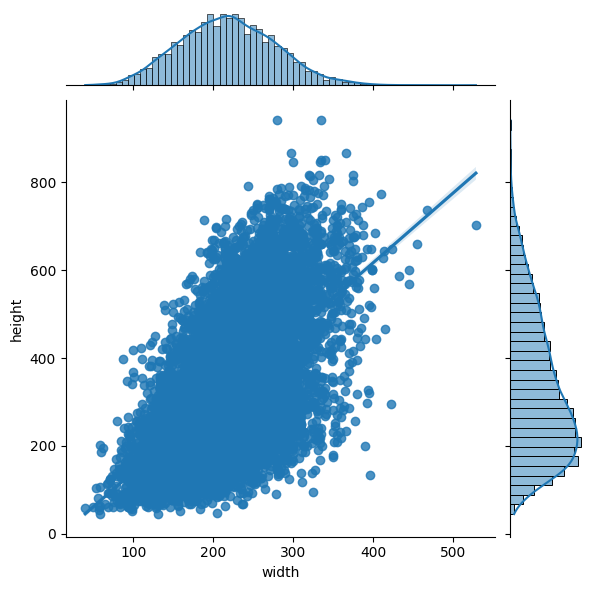

In [16]:
sns.jointplot(x = 'width', y = 'height', data = df, kind="reg")

- Data Reading from DICOM

##### This code defines a function named process_dicom_data that processes medical image data in the DICOM format.

- from tqdm import tqdm imports the tqdm library, which provides a progress bar for iterative processes.
- def process_dicom_data(data_df): is a function definition that takes a Pandas DataFrame (data_df) as input.
- for n, pid in tqdm(enumerate(data_df['patientId'].unique())): is a loop that iterates over the unique patient IDs in the 'patientId' column of data_df. enumerate() is used to obtain both the index n and the patient ID pid. The tqdm() function is used to display a progress bar for the loop.
- dcm_file = 'dataset/stage_2_train_images/%s.dcm' % pid constructs a file path for the DICOM image associated with the current patient ID.
- dcm_data = pydicom.read_file(dcm_file) reads the DICOM image data using the pydicom library and assigns the resulting object to dcm_data.
- idx = (data_df['patientId']==dcm_data.PatientID) creates a boolean mask that identifies the rows in data_df corresponding to the current patient ID.
- The remaining lines of code use the boolean mask to update specific columns in data_df with information from the DICOM image (dcm_data). Specifically, Modality, PatientAge, PatientSex, BodyPartExamined, and ViewPosition columns are updated with information from the DICOM header.
- Finally, the function returns the updated DataFrame (data_df).

In [17]:
from tqdm import tqdm
def process_dicom_data(data_df):
    for n, pid in tqdm(enumerate(data_df['patientId'].unique())):        
        dcm_file = 'dataset/stage_2_train_images/%s.dcm' % pid
        dcm_data = pydicom.read_file(dcm_file)        
        idx = (data_df['patientId']==dcm_data.PatientID)
        data_df.loc[idx,'Modality'] = dcm_data.Modality
        data_df.loc[idx,'PatientAge'] = pd.to_numeric(dcm_data.PatientAge)
        data_df.loc[idx,'PatientSex'] = dcm_data.PatientSex
        data_df.loc[idx,'BodyPartExamined'] = dcm_data.BodyPartExamined
        data_df.loc[idx,'ViewPosition'] = dcm_data.ViewPosition
        
    return data_df

In [18]:
dicom_df=df
dicom_df = process_dicom_data(dicom_df)

26684it [06:07, 72.56it/s]


In [19]:
dicom_df = dicom_df.astype({"PatientAge": int})
dicom_df.fillna(0.0, inplace=True)
dicom_df.head()

,patientId,x,y,width,height,Target,class,Modality,PatientAge,PatientSex,BodyPartExamined,ViewPosition
0,0004cfab-14fd-4e49-80ba-63a80b6bddd6,0.0,0.0,0.0,0.0,0,No Lung Opacity / Not Normal,CR,51,F,CHEST,PA
1,00313ee0-9eaa-42f4-b0ab-c148ed3241cd,0.0,0.0,0.0,0.0,0,No Lung Opacity / Not Normal,CR,48,F,CHEST,PA
2,00322d4d-1c29-4943-afc9-b6754be640eb,0.0,0.0,0.0,0.0,0,No Lung Opacity / Not Normal,CR,19,M,CHEST,AP
3,003d8fa0-6bf1-40ed-b54c-ac657f8495c5,0.0,0.0,0.0,0.0,0,Normal,CR,28,M,CHEST,PA
4,00436515-870c-4b36-a041-de91049b9ab4,264.0,152.0,213.0,379.0,1,Lung Opacity,CR,32,F,CHEST,AP


- There are 995 unique patient rows exist

In [20]:
dicom_df.nunique()

patientId           26684
x                     749
y                     727
width                 352
height                726
Target                  2
class                   3
Modality                1
PatientAge             97
PatientSex              2
BodyPartExamined        1
ViewPosition            2
dtype: int64

#### Now Visualizing the data along with their dicom header values

- Patient's age proportion in the detection

<AxesSubplot:xlabel='PatientAge', ylabel='count'>

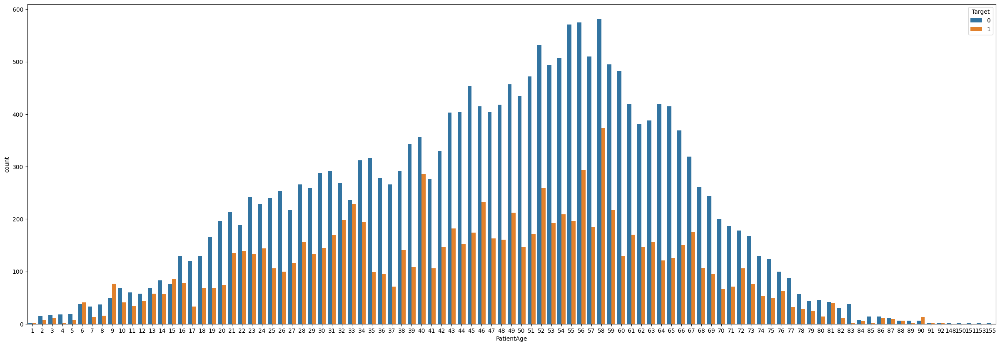

In [21]:
plt.figure(figsize = (30, 10))
sns.countplot(x = 'PatientAge', hue = 'Target', data = dicom_df)

- Patient's gender proportion in the detection

<AxesSubplot:xlabel='PatientSex', ylabel='count'>

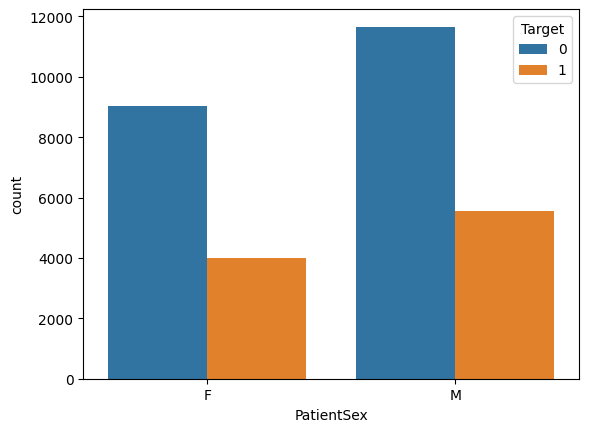

In [22]:
sns.countplot(x = 'PatientSex', hue = 'Target', data = dicom_df)

- With respect to view proportion

<AxesSubplot:xlabel='ViewPosition', ylabel='count'>

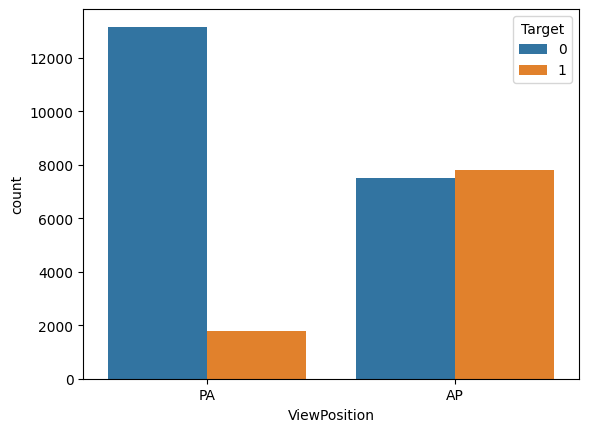

In [23]:
sns.countplot(x = 'ViewPosition', hue = 'Target', data = dicom_df)

In [24]:
dicom_df = dicom_df.drop('Target', axis=1)

In [25]:
dicom_df['PatientSex'].astype('category')
dicom_df['ViewPosition'].astype('category')
dicom_df['PatientSex'] = np.where(dicom_df["PatientSex"].str.contains("M"), 1, 0)
dicom_df['ViewPosition'] = np.where(dicom_df["ViewPosition"].str.contains("AP"), 1, 0)

In [26]:
dicom_df.head()

,patientId,x,y,width,height,class,Modality,PatientAge,PatientSex,BodyPartExamined,ViewPosition
0,0004cfab-14fd-4e49-80ba-63a80b6bddd6,0.0,0.0,0.0,0.0,No Lung Opacity / Not Normal,CR,51,0,CHEST,0
1,00313ee0-9eaa-42f4-b0ab-c148ed3241cd,0.0,0.0,0.0,0.0,No Lung Opacity / Not Normal,CR,48,0,CHEST,0
2,00322d4d-1c29-4943-afc9-b6754be640eb,0.0,0.0,0.0,0.0,No Lung Opacity / Not Normal,CR,19,1,CHEST,1
3,003d8fa0-6bf1-40ed-b54c-ac657f8495c5,0.0,0.0,0.0,0.0,Normal,CR,28,1,CHEST,0
4,00436515-870c-4b36-a041-de91049b9ab4,264.0,152.0,213.0,379.0,Lung Opacity,CR,32,0,CHEST,1


- Visualizing the dicom images

##### This code defines a function named show_dicom_image that displays a medical image in the DICOM format.

- def show_dicom_image(data_df): is a function definition that takes a Pandas DataFrame (data_df) as input.
- img_data = list(data_df.T.to_dict().values()) converts data_df into a list of dictionaries, where each dictionary represents a row in data_df. The resulting list is assigned to img_data.
- f, ax = plt.subplots(2,2, figsize=(16,18)) creates a figure with 4 subplots (arranged in a 2x2 grid) using the matplotlib.pyplot library. The resulting figure object and subplot objects are assigned to f and ax, respectively. The figsize parameter sets the size of the figure.
- The loop for i,data_row in enumerate(img_data): iterates over the list of dictionaries (img_data) and the index i.
- pid = data_row['patientId'] extracts the patient ID from the current row (data_row).
- dcm_file = 'dataset/stage_2_train_images/%s.dcm' % pid constructs a file path for the DICOM image associated with the current patient ID.
- dcm_data = pydicom.read_file(dcm_file) reads the DICOM image data using the pydicom library and assigns the resulting object to dcm_data.
- ax[i//2, i%2].imshow(dcm_data.pixel_array, cmap=plt.cm.bone) displays the DICOM image in the i-th subplot using the imshow() function from matplotlib.pyplot. The cmap parameter sets the colormap for the image. dcm_data.pixel_array returns a NumPy array of pixel values for the image.
- ax[i//2, i%2].set_title('ID: {}\n Age: {} Sex: {}'.format(...)) sets the title for the i-th subplot to display the patient ID, age, and sex associated with the current image.

In [27]:
def show_dicom_image(data_df):
        img_data = list(data_df.T.to_dict().values())
        f, ax = plt.subplots(2,2, figsize=(16,18))
        for i,data_row in enumerate(img_data):
            pid = data_row['patientId']
            dcm_file = 'dataset/stage_2_train_images/%s.dcm' % pid
            dcm_data = pydicom.read_file(dcm_file)                    
            ax[i//2, i%2].imshow(dcm_data.pixel_array, cmap=plt.cm.bone)
            ax[i//2, i%2].set_title('ID: {}\n Age: {} Sex: {}'.format(
                data_row['patientId'],dcm_data.PatientAge, dcm_data.PatientSex))

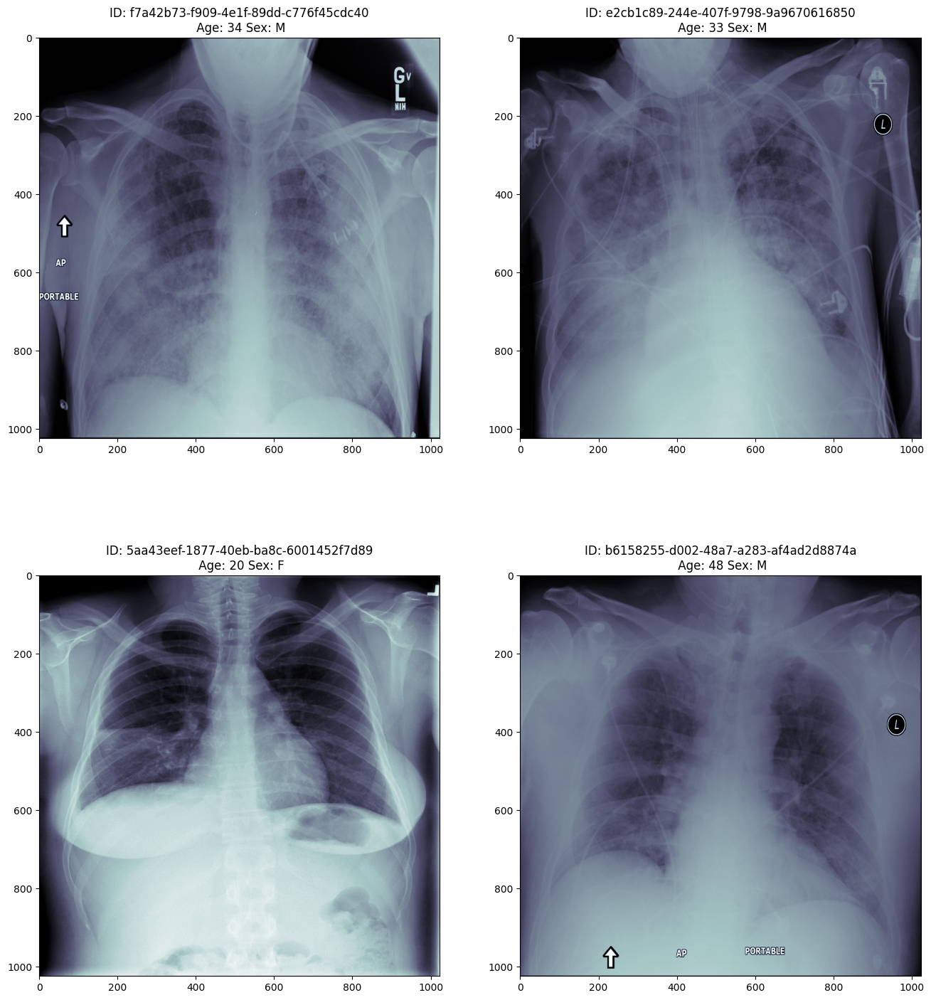

In [28]:
show_dicom_image(df[df['Target']==1].sample(n=4))

- Showing some random dicom images of a patient who do not have Pnuemonia, however with class No Lung Opacity / Not Normal

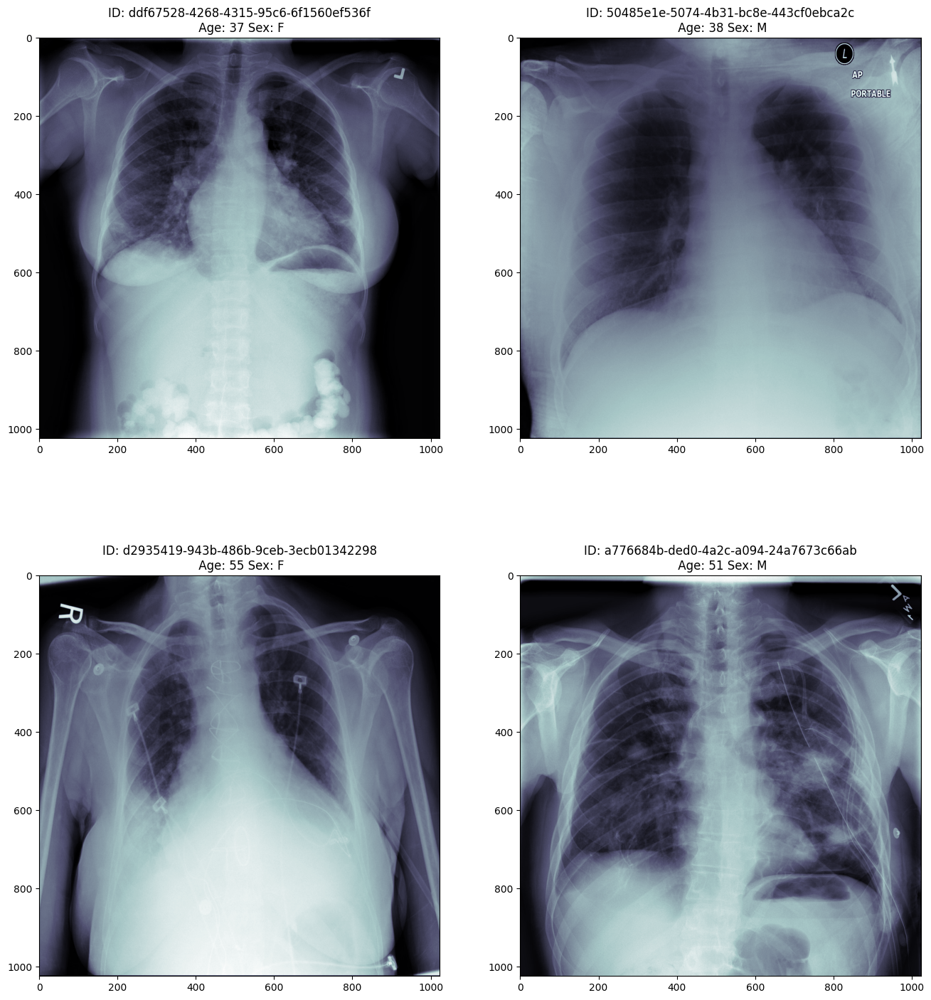

In [29]:
show_dicom_image(df[ (df['Target']==0) & (df['class']=='No Lung Opacity / Not Normal')].sample(n=4))

- Showing some random dicom images of a patients who do not have Pnuemonia, however with class Normal

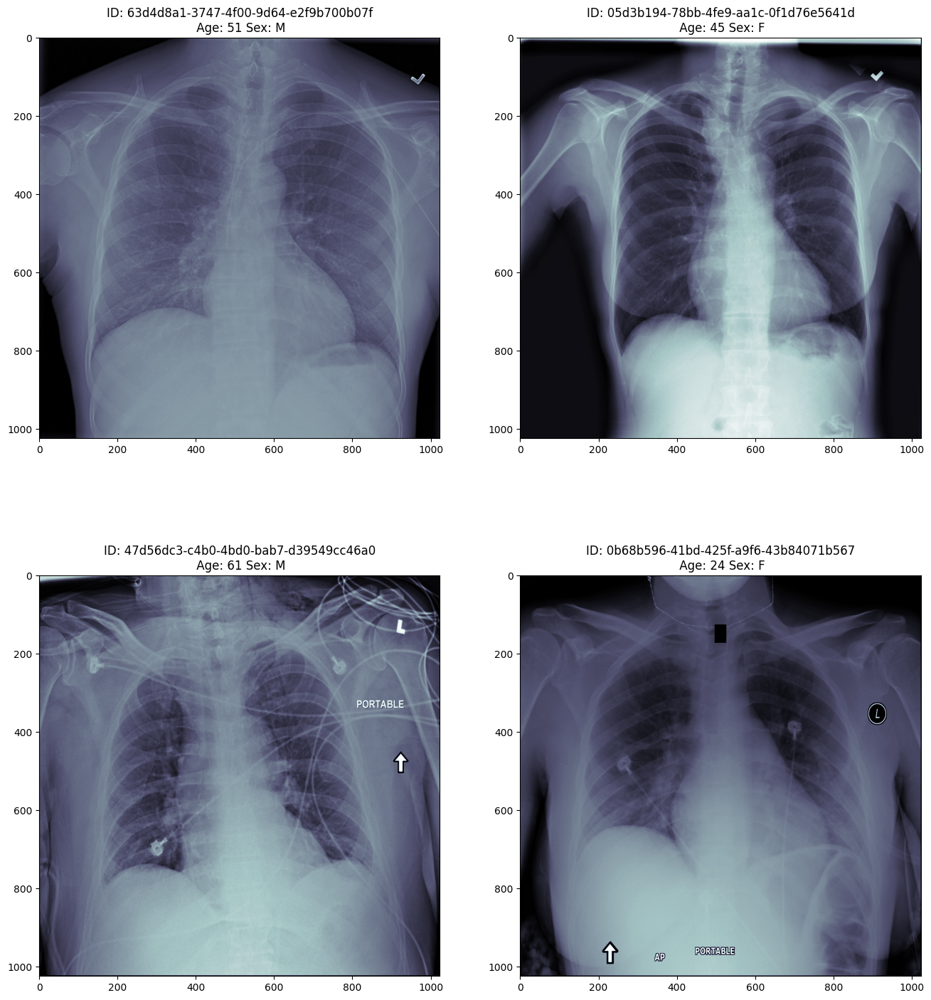

In [30]:
show_dicom_image(df[ (df['Target']==0) & (df['class']=='Normal')].sample(n=4))

##### This code defines a function named show_dicome_with_boundingbox that displays a medical image in the DICOM format with bounding boxes that indicate the location of potential pneumonia in the image.

- def show_dicome_with_boundingbox(data_df): is a function definition that takes a Pandas DataFrame (data_df) as input.
- img_data = list(data_df.T.to_dict().values()) converts data_df into a list of dictionaries, where each dictionary represents a row in data_df. The resulting list is assigned to img_data.
- f, ax = plt.subplots(2,2, figsize=(16,18)) creates a figure with 4 subplots (arranged in a 2x2 grid) using the matplotlib.pyplot library. The resulting figure object and subplot objects are assigned to f and ax, respectively. The figsize parameter sets the size of the figure.
- The loop for i,data_row in enumerate(img_data): iterates over the list of dictionaries (img_data) and the index i.
- pid = data_row['patientId'] extracts the patient ID from the current row (data_row).
- dcm_file = 'dataset/stage_2_train_images/%s.dcm' % pid constructs a file path for the DICOM image associated with the current patient ID.
- dcm_data = pydicom.read_file(dcm_file) reads the DICOM image data using the pydicom library and assigns the resulting object to dcm_data.
- ax[i//2, i%2].imshow(dcm_data.pixel_array, cmap=plt.cm.bone) displays the DICOM image in the i-th subplot using the imshow() function from matplotlib.pyplot. The cmap parameter sets the colormap for the image. dcm_data.pixel_array returns a NumPy array of pixel values for the image.
- ax[i//2, i%2].set_title('ID: {}\n Age: {} Sex: {}'.format(...)) sets the title for the i-th subplot to display the patient ID, age, and sex associated with the current image.
- rows = data_df[data_df['patientId']==data_row['patientId']] creates a DataFrame (rows) containing only the rows in data_df corresponding to the current patient ID.
- box_data = list(rows.T.to_dict().values()) converts rows into a list of dictionaries (box_data), where each dictionary represents a row in rows.
- The loop for j, row in enumerate(box_data): iterates over the list of dictionaries (box_data) and the index j.
- x,y,width,height = row['x'], row['y'],row['width'],row['height'] extracts the coordinates and dimensions of the bounding box from the current dictionary (row).
- rectangle = Rectangle(xy=(x,y),width=width, height=height, color="red",alpha = 0.2) creates a rectangle object using the Rectangle() function from matplotlib.patches. The xy, width, and height parameters define the location and dimensions of the rectangle. The color parameter sets the color of the rectangle to red, and the alpha parameter sets the opacity of the rectangle to 0.2.
- ax[i//2, i%2].add_patch(rectangle) adds the rectangle object to the i-th subplot using the add_patch() method of the subplot object.

In [31]:
def show_dicome_with_boundingbox(data_df):
    img_data = list(data_df.T.to_dict().values())
    f, ax = plt.subplots(2,2, figsize=(16,18))
    for i,data_row in enumerate(img_data):
        pid = data_row['patientId']
        dcm_file = 'dataset/stage_2_train_images/%s.dcm' % pid
        dcm_data = pydicom.read_file(dcm_file)                    
        ax[i//2, i%2].imshow(dcm_data.pixel_array, cmap=plt.cm.bone)
        ax[i//2, i%2].set_title('ID: {}\n Age: {} Sex: {}'.format(
                data_row['patientId'],dcm_data.PatientAge, dcm_data.PatientSex))
        rows = data_df[data_df['patientId']==data_row['patientId']]
        box_data = list(rows.T.to_dict().values())        
        for j, row in enumerate(box_data):            
            x,y,width,height = row['x'], row['y'],row['width'],row['height']
            rectangle = Rectangle(xy=(x,y),width=width, height=height, color="red",alpha = 0.2)
            ax[i//2, i%2].add_patch(rectangle)  

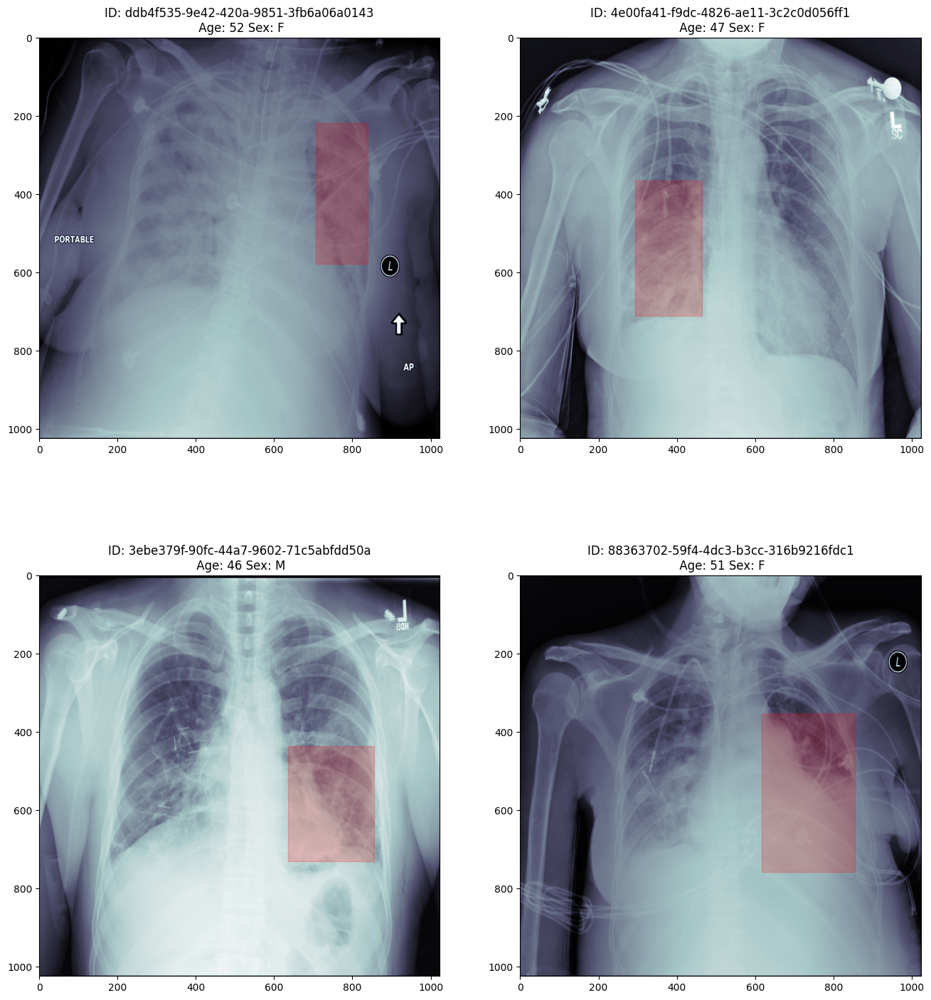

In [32]:
show_dicome_with_boundingbox(df[df['Target']==1].sample(n=4))

# Model Building

##### These lines of code import various libraries and modules that will be used later in the code:

- import csv provides functionality for reading and writing CSV files (comma-separated values).
- import random provides functions for generating random numbers and shuffling sequences.
- import numpy as np imports the numpy library and assigns it the alias np. numpy is a library for numerical computing in Python.
- import pandas as pd imports the pandas library and assigns it the alias pd. pandas is a library for data manipulation and analysis in Python.
- from skimage import measure imports the measure module from the scikit-image library. scikit-image is a collection of algorithms for image processing.
- from skimage.transform import resize imports the resize function from the transform module of the scikit-image library.
- import matplotlib.patches as patches imports the patches module from the matplotlib library. matplotlib is a plotting library for Python.
- import tensorflow as tf imports the tensorflow library and assigns it the alias tf. tensorflow is a library for machine learning and artificial intelligence.
- from tensorflow import keras imports the keras module from the tensorflow library. keras is a high-level API for building and training deep learning models.

In [33]:
import csv
import random
import numpy as np
import pandas as pd
from skimage import measure
from skimage.transform import resize
import matplotlib.patches as patches
import tensorflow as tf
from tensorflow import keras

### Load pneumonia locations

Table contains [filename : pneumonia location] pairs per row.

If a filename contains multiple pneumonia, the table contains multiple rows with the same filename but different pneumonia locations. If a filename contains no pneumonia it contains a single row with an empty pneumonia location. The code below loads the table and transforms it into a dictionary.

The dictionary uses the filename as key and a list of pneumonia locations in that filename as value. If a filename is not present in the dictionary it means that it contains no pneumonia.

In [34]:
pneumonia_locations = {}
# load table
with open(os.path.join('dataset/stage_2_train_labels.csv'), mode='r') as infile:
    # open reader
    reader = csv.reader(infile)
    # skip header
    next(reader, None)
    # loop through rows
    for rows in reader:
        # retrieve information
        filename = rows[0]
        location = rows[1:5]
        pneumonia = rows[5]
        # if row contains pneumonia add label to dictionary
        # which contains a list of pneumonia locations per filename
        if pneumonia == '1':
            # convert string to float to int
            location = [int(float(i)) for i in location]
            # save pneumonia location in dictionary
            if filename in pneumonia_locations:
                pneumonia_locations[filename].append(location)
            else:
                pneumonia_locations[filename] = [location]

### Load image filenames

In [35]:
# load and shuffle filenames
folder = 'dataset/stage_2_train_images'
filenames = os.listdir(folder)
random.shuffle(filenames)
# split into train and validation filenames
n_valid_samples = 2560
train_filenames = filenames[n_valid_samples:]
valid_filenames = filenames[:n_valid_samples]
print('n train samples', len(train_filenames))
print('n valid samples', len(valid_filenames))
n_train_samples = len(filenames) - n_valid_samples

n train samples 24124
n valid samples 2560


## Data generator

The dataset is too large to fit into memory, so we need to create a generator that loads data on the fly.

The generator takes in some filenames, batch_size and other parameters.

The generator outputs a random batch of numpy images and numpy masks.

##### This code defines a Python class named generator that extends the keras.utils.Sequence class. This class will be used to generate batches of images for training and prediction in a deep learning model.

- class generator(keras.utils.Sequence): is a class definition that extends the keras.utils.Sequence class.
- def __init__(self, folder, filenames, pneumonia_locations=None, batch_size=32, image_size=256, shuffle=True, augment=False, predict=False): is a constructor for the generator class. It takes several parameters as input:
1. folder is the folder containing the image files.
2. filenames is a list of filenames for the image files.
3. pneumonia_locations is a DataFrame containing the locations of pneumonia in the images (if available).
4. batch_size is the number of images to include in each batch.
5. image_size is the size (in pixels) to resize the images.
6. shuffle is a Boolean value indicating whether to shuffle the order of the image files.
7. augment is a Boolean value indicating whether to apply data augmentation to the images.
8. predict is a Boolean value indicating whether the generator will be used for training or prediction.
9. self.folder = folder, self.filenames = filenames, self.pneumonia_locations = pneumonia_locations, etc. set the corresponding instance variables of the class.
10. self.on_epoch_end() is a method of the class that is called at the end of each epoch. This method can be used to shuffle the order of the image files (if self.shuffle is True), for example.

In [92]:
class generator(keras.utils.Sequence):    
    def __init__(self, folder, filenames, pneumonia_locations=None, batch_size=32, image_size=256, shuffle=True, augment=False, predict=False):
        self.folder = folder
        self.filenames = filenames
        self.pneumonia_locations = pneumonia_locations
        self.batch_size = batch_size
        self.image_size = image_size
        self.shuffle = shuffle
        self.augment = augment
        self.predict = predict
        self.on_epoch_end()
        
    def __load__(self, filename):
        # load dicom file as numpy array
        img = pydicom.dcmread(os.path.join(self.folder, filename)).pixel_array
        # create empty mask
        msk = np.zeros(img.shape)
        # get filename without extension
        filename = filename.split('.')[0]
        # if image contains pneumonia
        if filename in self.pneumonia_locations:
            # loop through pneumonia
            for location in self.pneumonia_locations[filename]:
                # add 1's at the location of the pneumonia
                x, y, w, h = location
                msk[y:y+h, x:x+w] = 1
        # resize both image and mask
        img = resize(img, (self.image_size, self.image_size), mode='reflect')
        msk = resize(msk, (self.image_size, self.image_size), mode='reflect') > 0.5
        # if augment then horizontal flip half the time
        if self.augment and random.random() > 0.5:
            img = np.fliplr(img)
            msk = np.fliplr(msk)
        # add trailing channel dimension
        img = np.expand_dims(img, -1)
        msk = np.expand_dims(msk, -1)
        return img, msk
    
    def __loadpredict__(self, filename):
        # Check if file is a DICOM file
        if filename.lower().endswith(".dcm"):
            # Load DICOM file as numpy array
            img = pydicom.dcmread(os.path.join(self.folder, filename)).pixel_array
        else:
            # Load image file using PIL
            img = Image.open(os.path.join(self.folder, filename))
            # Convert image to numpy array
            img = np.array(img)

        # Resize image
        img = resize(img, (self.image_size, self.image_size), mode='reflect')

        # Normalize pixel values
        img /= 255.

        return img
        
    def __getitem__(self, index):
        # select batch
        filenames = self.filenames[index*self.batch_size:(index+1)*self.batch_size]
        # predict mode: return images and filenames
        if self.predict:
            # load files
            imgs = [self.__loadpredict__(filename) for filename in filenames]
            # create numpy batch
            imgs = np.array(imgs)
            return imgs, filenames
        # train mode: return images and masks
        else:
            # load files
            items = [self.__load__(filename) for filename in filenames]
            # unzip images and masks
            imgs, msks = zip(*items)
            # create numpy batch
            imgs = np.array(imgs)
            msks = np.array(msks)
            return imgs, msks
        
    def on_epoch_end(self):
        if self.shuffle:
            random.shuffle(self.filenames)
        
    def __len__(self):
        if self.predict:
            # return everything
            return int(np.ceil(len(self.filenames) / self.batch_size))
        else:
            # return full batches only
            return int(len(self.filenames) / self.batch_size)

##### def create_downsample(channels, inputs): is a function definition that takes two inputs: channels (the number of output channels) and inputs (the input tensor).

1. x = keras.layers.BatchNormalization(momentum=0.9)(inputs) applies batch normalization to the input tensor inputs using the BatchNormalization() layer from the keras.layers module.
2. x = keras.layers.LeakyReLU(0)(x) applies the leaky ReLU activation function to the output of the previous layer using the LeakyReLU() layer from the keras.layers module. The parameter 0 sets the slope of the negative region of the activation function to 0.
3. x = keras.layers.Conv2D(channels, 1, padding='same', use_bias=False)(x) applies a 2D convolution to the output of the previous layer using the Conv2D() layer from the keras.layers module. The channels parameter sets the number of output channels for the convolution. The 1 parameter sets the size of the convolution kernel to 1x1. The padding parameter sets the type of padding to use ('same' pads the input such that the output has the same spatial dimensions as the input). The use_bias parameter is set to False to disable the use of bias terms in the convolution.
4. x = keras.layers.MaxPool2D(2)(x) applies a 2D max pooling operation to the output of the previous layer using the MaxPool2D() layer from the keras.layers module. The 2 parameter sets the size of the pooling kernel to 2x2.

##### def create_resblock(channels, inputs): is a function definition that takes two inputs: channels (the number of output channels) and inputs (the input tensor).

1. x = keras.layers.BatchNormalization(momentum=0.9)(inputs) applies batch normalization to the input tensor inputs using the BatchNormalization() layer from the keras.layers module.
2. x = keras.layers.LeakyReLU(0)(x) applies the leaky ReLU activation function to the output of the previous layer using the LeakyReLU() layer from the keras.layers module. The parameter 0 sets the slope of the negative region of the activation function to 0.
3. x = keras.layers.Conv2D(channels, 3, padding='same', use_bias=False)(x) applies a 2D convolution to the output of the previous layer using the Conv2D() layer from the keras.layers module. The channels parameter sets the number of output channels for the convolution. The 3 parameter sets the size of the convolution kernel to 3x3. The padding parameter sets the type of padding to use ('same' pads the input such that the output has the same spatial dimensions as the input). The use_bias parameter is set to False to disable the use of bias terms in the convolution.
4. x = keras.layers.BatchNormalization(momentum=0.9)(x) applies batch normalization to the output of the previous layer using the BatchNormalization() layer from the keras.layers module.
5. x = keras.layers.LeakyReLU(0)(x) applies the leaky ReLU activation function to the output of the previous layer using the LeakyReLU() layer from the keras.layers module. The parameter 0 sets the slope of the negative region of the activation function to 0.
6. x = keras.layers.Conv2D(channels, 3, padding='same', use_bias=False)(x) applies a 2D convolution to the output of the previous layer using the Conv2D() layer from the keras.layers module. The channels parameter sets the number of output channels for the convolution. The 3 parameter sets the size of the convolution kernel to 3x3. The padding parameter sets the type of padding to use ('same' pads the input such that the output has the same spatial dimensions as the input). The use_bias parameter is set to False to disable the use of bias terms in the convolution.
7. return keras.layers.add([x, inputs]) adds the output of the final convolutional layer to the input tensor inputs. This creates a residual block, which can help improve the flow of information through the network.

##### def create_network(input_size, channels, n_blocks=2, depth=4): is a function definition that takes three inputs: input_size (the size of the input images), channels (the number of channels in the first convolutional layer), n_blocks (the number of residual blocks in each depth level), and depth (the number of depth levels in the network).

1. inputs = keras.Input(shape=(input_size, input_size, 1)) creates a new input tensor for the network with the given shape.
2. x = keras.layers.Conv2D(channels, 3, padding='same', use_bias=False)(inputs) applies a 2D convolution to the input tensor using the Conv2D() layer from the keras.layers module. The channels parameter sets the number of output channels for the convolution. The 3 parameter sets the size of the convolution kernel to 3x3. The padding parameter sets the type of padding to use ('same' pads the input such that the output has the same spatial dimensions as the input). The use_bias parameter is set to False to disable the use of bias terms in the convolution.
3. for d in range(depth): iterates over each depth level in the network.
4. channels = channels * 2 doubles the number of output channels for each depth level.
5. x = create_downsample(channels, x) applies a downsampling block to the output of the previous layer using the create_downsample() function.
6. for b in range(n_blocks): iterates over each residual block in the depth level.
7. x = create_resblock(channels, x) applies a residual block to the output of the previous layer using the create_resblock() function.
8. x = keras.layers.BatchNormalization(momentum=0.9)(x) applies batch normalization to the output of the final residual block using the BatchNormalization() layer from the keras.layers module.
9. x = keras.layers.LeakyReLU(0)(x) applies the leaky ReLU activation function to the output of the previous layer using the LeakyReLU() layer from the keras.layers module. The parameter 0 sets the slope of the negative region of the activation function to 0.
10. x = keras.layers.Conv2D(1, 1, activation='sigmoid')(x) applies a 2D convolution to the output of the previous layer using the Conv2D() layer from the keras.layers module. The 1 parameter sets the number of output channels to 1. The 1 parameter sets the size of the convolution kernel to 1x1. The activation parameter is set to 'sigmoid' to produce a probability map.
11. outputs = keras.layers.UpSampling2D(2**depth)(x) applies upsampling to the output of the final convolutional layer using the UpSampling2D() layer from the keras.layers module. The 2**depth parameter sets the size of the upsampling kernel to 2^depth.
12. model = keras.Model(inputs=inputs, outputs=outputs) creates a new Keras model with the given input and output tensors.

In [93]:
# define iou or jaccard loss function
def iou_loss(y_true, y_pred):
    y_true=tf.cast(y_true, tf.float32)
    y_pred=tf.cast(y_pred, tf.float32)
    y_true = tf.reshape(y_true, [-1])
    y_pred = tf.reshape(y_pred, [-1])
   
    intersection = tf.reduce_sum(y_true * y_pred)
    score = (intersection + 1.) / (tf.reduce_sum(y_true) + tf.reduce_sum(y_pred) - intersection + 1.)
    return 1 - score

# combine bce loss and iou loss
def iou_bce_loss(y_true, y_pred):
    return 0.5 * keras.losses.binary_crossentropy(y_true, y_pred) + 0.5 * iou_loss(y_true, y_pred)

# mean iou as a metric
def mean_iou(y_true, y_pred):
    y_pred = tf.round(y_pred)
    intersect = tf.reduce_sum(y_true * y_pred, axis=[1, 2, 3])
    union = tf.reduce_sum(y_true, axis=[1, 2, 3]) + tf.reduce_sum(y_pred, axis=[1, 2, 3])
    smooth = tf.ones(tf.shape(intersect))
    return tf.reduce_mean((intersect + smooth) / (union - intersect + smooth))

def create_downsample(channels, inputs):
    x = keras.layers.BatchNormalization(momentum=0.9)(inputs)
    x = keras.layers.LeakyReLU(0)(x)
    x = keras.layers.Conv2D(channels, 1, padding='same', use_bias=False)(x)
    x = keras.layers.MaxPool2D(2)(x)
    return x

def create_resblock(channels, inputs):
    x = keras.layers.BatchNormalization(momentum=0.9)(inputs)
    x = keras.layers.LeakyReLU(0)(x)
    x = keras.layers.Conv2D(channels, 3, padding='same', use_bias=False)(x)
    x = keras.layers.BatchNormalization(momentum=0.9)(x)
    x = keras.layers.LeakyReLU(0)(x)
    x = keras.layers.Conv2D(channels, 3, padding='same', use_bias=False)(x)
    return keras.layers.add([x, inputs])

def create_network(input_size, channels, n_blocks=2, depth=4):
    # input
    inputs = keras.Input(shape=(input_size, input_size, 1))
    x = keras.layers.Conv2D(channels, 3, padding='same', use_bias=False)(inputs)
    # residual blocks
    for d in range(depth):
        channels = channels * 2
        x = create_downsample(channels, x)
        for b in range(n_blocks):
            x = create_resblock(channels, x)
    # output
    x = keras.layers.BatchNormalization(momentum=0.9)(x)
    x = keras.layers.LeakyReLU(0)(x)
    x = keras.layers.Conv2D(1, 1, activation='sigmoid')(x)
    outputs = keras.layers.UpSampling2D(2**depth)(x)
    model = keras.Model(inputs=inputs, outputs=outputs)
    return model


In [94]:
BATCH_SIZE = 128
IMAGE_SIZE = 128

##### This code trains and evaluates the CNN created by the create_network() function for image segmentation.

- model = create_network(input_size=IMAGE_SIZE, channels=32, n_blocks=2, depth=4) creates a new CNN for image segmentation using the create_network() function with the given parameters.
- model.compile(optimizer='adam', loss=iou_bce_loss, metrics=['accuracy', mean_iou]) compiles the CNN with the Adam optimizer, the IOU-BCE loss function, and the accuracy and mean IOU metrics.
- def cosine_annealing(x): defines a new function named cosine_annealing that takes one input: x (the current epoch number).
- lr = 0.0001 sets the base learning rate to 0.0001.
- epochs = 2 sets the total number of epochs to 2.
- return lr*(np.cos(np.pi*x/epochs)+1.)/2 returns the learning rate for the given epoch using the cosine annealing schedule.
- learning_rate = tf.keras.callbacks.LearningRateScheduler(cosine_annealing) creates a new learning rate scheduler that applies the cosine_annealing() function to the learning rate at the end of each epoch.
- folder = 'dataset/stage_2_train_images' sets the path to the folder containing the training images.
- train_gen = generator(folder, train_filenames, pneumonia_locations, batch_size=BATCH_SIZE, image_size=IMAGE_SIZE, shuffle=True, augment=False, predict=False) creates a new generator for training the CNN using the generator() function with the given parameters.
- valid_gen = generator(folder, valid_filenames, pneumonia_locations, batch_size=BATCH_SIZE, image_size=IMAGE_SIZE, shuffle=False, predict=False) creates a new generator for validating the CNN using the generator() function with the given parameters.
- print(model.summary()) prints a summary of the CNN's architecture.

In [96]:
model = create_network(input_size=IMAGE_SIZE, channels=32, n_blocks=2, depth=4)
model.compile(optimizer='adam', loss=iou_bce_loss, metrics=['accuracy', mean_iou])

# cosine learning rate annealing
def cosine_annealing(x):
    lr = 0.0001
    epochs = 2
    return lr*(np.cos(np.pi*x/epochs)+1.)/2


learning_rate = tf.keras.callbacks.LearningRateScheduler(cosine_annealing)

# create train and validation generators
folder = 'dataset/stage_2_train_images'
train_gen = generator(folder, train_filenames, pneumonia_locations, batch_size=BATCH_SIZE, image_size=IMAGE_SIZE, shuffle=True, augment=False, predict=False)
valid_gen = generator(folder, valid_filenames, pneumonia_locations, batch_size=BATCH_SIZE, image_size=IMAGE_SIZE, shuffle=False, predict=False)

print(model.summary())

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 128, 128, 1  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_44 (Conv2D)             (None, 128, 128, 32  288         ['input_3[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization_42 (BatchN  (None, 128, 128, 32  128        ['conv2d_44[0][0]']              
 ormalization)                  )                                                           

 leaky_re_lu_50 (LeakyReLU)     (None, 32, 32, 128)  0           ['batch_normalization_50[0][0]'] 
                                                                                                  
 conv2d_53 (Conv2D)             (None, 32, 32, 128)  147456      ['leaky_re_lu_50[0][0]']         
                                                                                                  
 batch_normalization_51 (BatchN  (None, 32, 32, 128)  512        ['conv2d_53[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 leaky_re_lu_51 (LeakyReLU)     (None, 32, 32, 128)  0           ['batch_normalization_51[0][0]'] 
                                                                                                  
 conv2d_54 (Conv2D)             (None, 32, 32, 128)  147456      ['leaky_re_lu_51[0][0]']         
          

                                                                  'max_pooling2d_11[0][0]']       
                                                                                                  
 batch_normalization_60 (BatchN  (None, 8, 8, 512)   2048        ['add_22[0][0]']                 
 ormalization)                                                                                    
                                                                                                  
 leaky_re_lu_60 (LeakyReLU)     (None, 8, 8, 512)    0           ['batch_normalization_60[0][0]'] 
                                                                                                  
 conv2d_63 (Conv2D)             (None, 8, 8, 512)    2359296     ['leaky_re_lu_60[0][0]']         
                                                                                                  
 batch_normalization_61 (BatchN  (None, 8, 8, 512)   2048        ['conv2d_63[0][0]']              
 ormalizat

In [97]:
EPOCHS=2

history = model.fit_generator(train_gen, validation_data=valid_gen, callbacks=[learning_rate], epochs=EPOCHS)

Epoch 1/2
188/188 [==============================] - 6631s 35s/step - loss: 0.4997 - accuracy: 0.9495 - mean_iou: 0.6528 - val_loss: 0.4502 - val_accuracy: 0.9685 - val_mean_iou: 0.7128 - lr: 1.0000e-04
Epoch 2/2
188/188 [==============================] - 6370s 34s/step - loss: 0.4321 - accuracy: 0.9679 - mean_iou: 0.7211 - val_loss: 0.4326 - val_accuracy: 0.9683 - val_mean_iou: 0.7314 - lr: 5.0000e-05


### Plot Accuracy / Loss

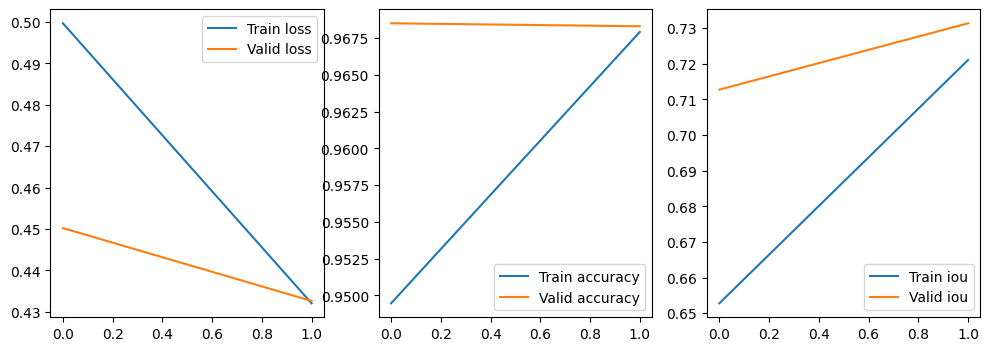

In [98]:
plt.figure(figsize=(12,4))
plt.subplot(131)
plt.plot(history.epoch, history.history["loss"], label="Train loss")
plt.plot(history.epoch, history.history["val_loss"], label="Valid loss")
plt.legend()
plt.subplot(132)
plt.plot(history.epoch, history.history["accuracy"], label="Train accuracy")
plt.plot(history.epoch, history.history["val_accuracy"], label="Valid accuracy")
plt.legend()
plt.subplot(133)
plt.plot(history.epoch, history.history["mean_iou"], label="Train iou")
plt.plot(history.epoch, history.history["val_mean_iou"], label="Valid iou")
plt.legend()
plt.show()

### Predict test images

4/4 [==============================] - 5s 1s/step


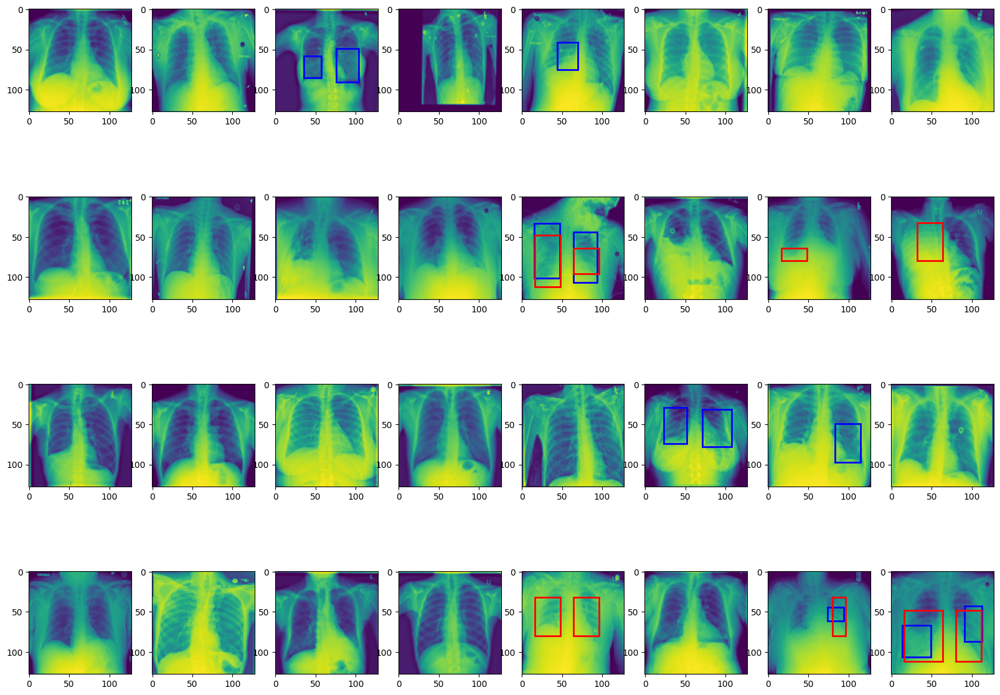

In [99]:
i=0
for imgs, msks in valid_gen:    
    # predict batch of images
    preds = model.predict(imgs)
    # create figure
    f, axarr = plt.subplots(4, 8, figsize=(20,15))
    axarr = axarr.ravel()
    axidx = 0
    # loop through batch
    for img, msk, pred in zip(imgs, msks, preds):
        i=i+1
        #exit after 32 images
        if i>32:
            break
        # plot image
        axarr[axidx].imshow(img[:, :, 0])
        # threshold true mask
        comp = msk[:, :, 0] > 0.5
        # apply connected components
        comp = measure.label(comp)
        # apply bounding boxes
        predictionString = ''
        for region in measure.regionprops(comp):
            # retrieve x, y, height and width
            y, x, y2, x2 = region.bbox
            height = y2 - y
            width = x2 - x
            axarr[axidx].add_patch(patches.Rectangle((x,y),width,height,linewidth=2,edgecolor='b',facecolor='none'))
        # threshold predicted mask
        comp = pred[:, :, 0] > 0.5
        # apply connected components
        comp = measure.label(comp)
        # apply bounding boxes
        predictionString = ''
        for region in measure.regionprops(comp):
            # retrieve x, y, height and width
            y, x, y2, x2 = region.bbox
            height = y2 - y
            width = x2 - x
            axarr[axidx].add_patch(patches.Rectangle((x,y),width,height,linewidth=2,edgecolor='r',facecolor='none'))
        axidx += 1
    plt.show()
    # only plot one batch
    break

### Detection on images

- Model Save

In [103]:
model_new = "model_new.h5"
model.save(model_new)

- Load and preprocess the input image

In [110]:
def load_and_preprocess_image(filename, image_size=128):
    img = Image.open(filename)
    img = np.array(img)
    img = resize(img, (image_size, image_size), mode='reflect')
    img = np.expand_dims(img, -1)
    img = np.expand_dims(img, 0)  # Add batch dimension
    return img

- Model Load

In [111]:
from keras.models import load_model
model = load_model('model_new.h5', custom_objects={'iou_bce_loss': iou_bce_loss, 'mean_iou': mean_iou})

- Image Path and image filenames loading

In [112]:
# Path to the folder containing the exported JPEG images
data_folder = 'random'

# List of image filenames
image_files = os.listdir(data_folder)

- Process and predict on each image

1/1 [==============================] - 0s 60ms/step
Coordinates: x=32, y=32, x2=64, y2=96
Coordinates: x=80, y=48, x2=112, y2=96
Percentage of area affected: 21.88%


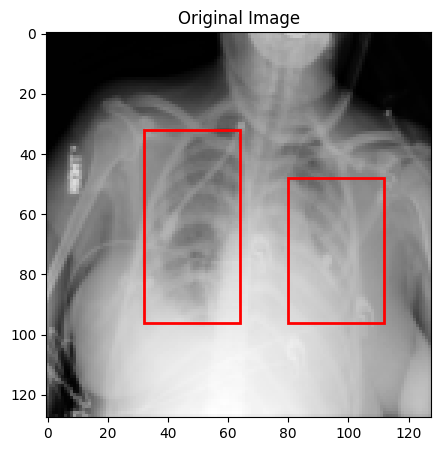

1/1 [==============================] - 0s 71ms/step
Coordinates: x=16, y=32, x2=48, y2=96
Coordinates: x=64, y=32, x2=112, y2=96
Percentage of area affected: 31.25%


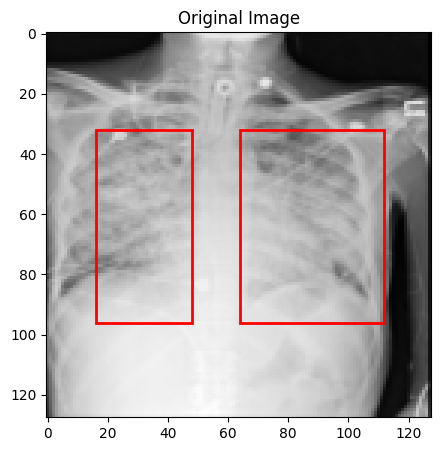

1/1 [==============================] - 0s 66ms/step
Coordinates: x=16, y=32, x2=48, y2=80
Coordinates: x=64, y=32, x2=96, y2=80
Percentage of area affected: 18.75%


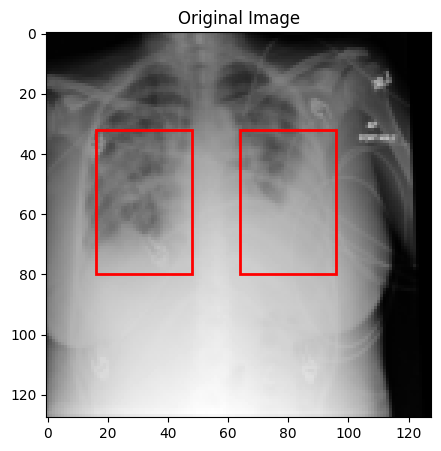

1/1 [==============================] - 0s 60ms/step
Percentage of area affected: 0.00%


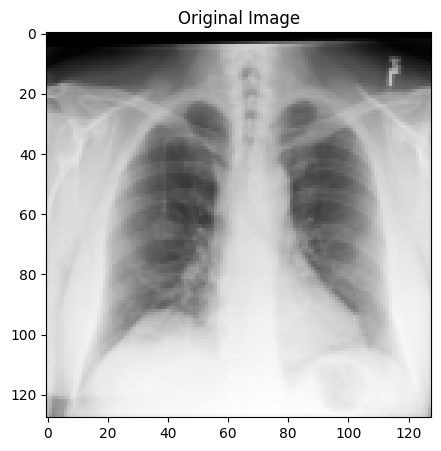

1/1 [==============================] - 0s 69ms/step
Coordinates: x=64, y=48, x2=80, y2=80
Percentage of area affected: 3.12%


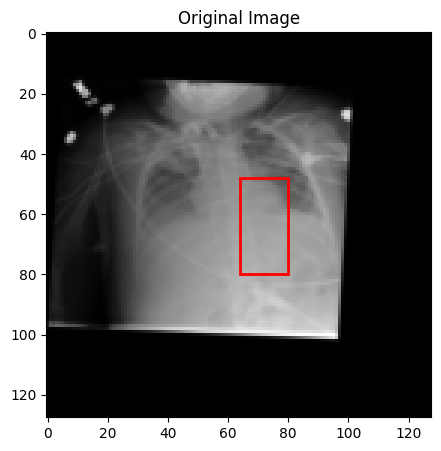

1/1 [==============================] - 0s 66ms/step
Coordinates: x=32, y=48, x2=64, y2=96
Coordinates: x=80, y=64, x2=112, y2=96
Percentage of area affected: 15.62%


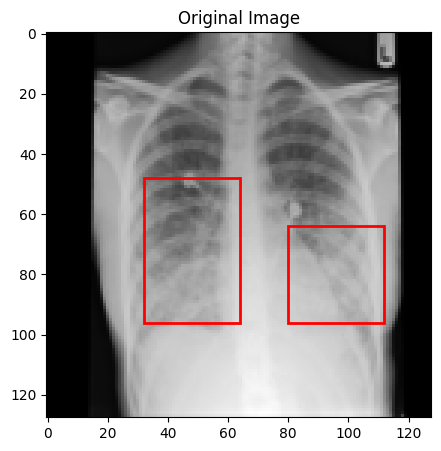

1/1 [==============================] - 0s 62ms/step
Percentage of area affected: 0.00%


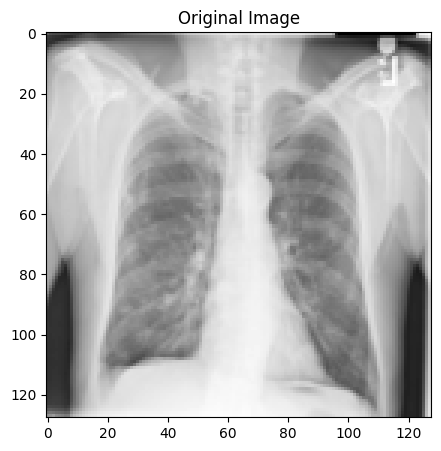

1/1 [==============================] - 0s 80ms/step
Percentage of area affected: 0.00%


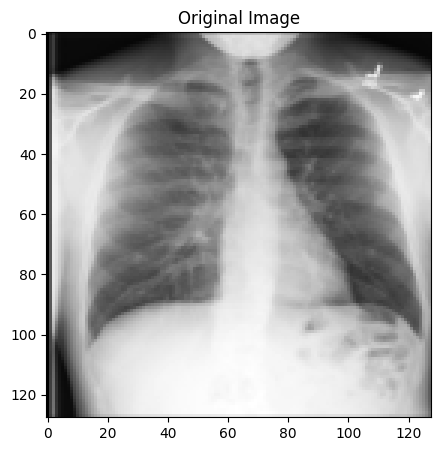

1/1 [==============================] - 0s 67ms/step
Percentage of area affected: 0.00%


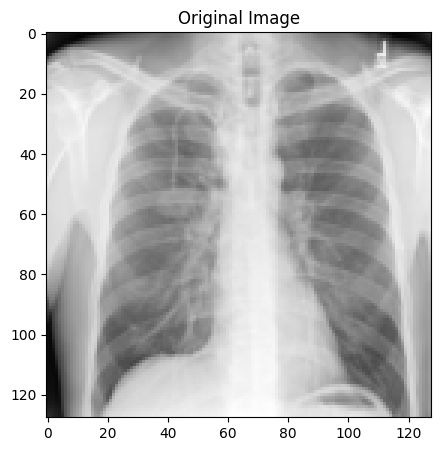

1/1 [==============================] - 0s 66ms/step
Percentage of area affected: 0.00%


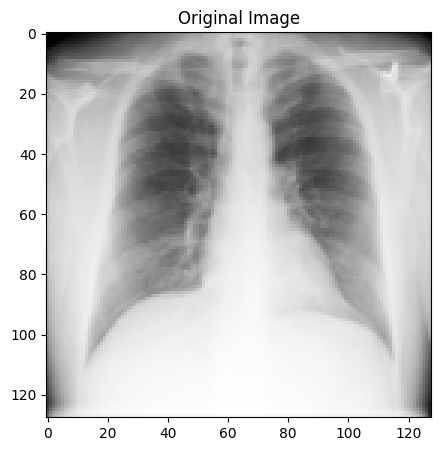

1/1 [==============================] - 0s 72ms/step
Percentage of area affected: 0.00%


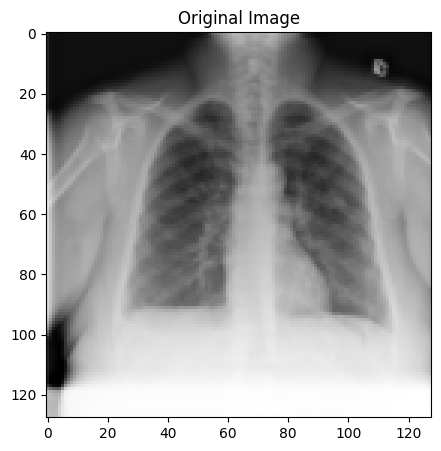

1/1 [==============================] - 0s 69ms/step
Coordinates: x=16, y=32, x2=48, y2=96
Coordinates: x=64, y=32, x2=96, y2=96
Percentage of area affected: 25.00%


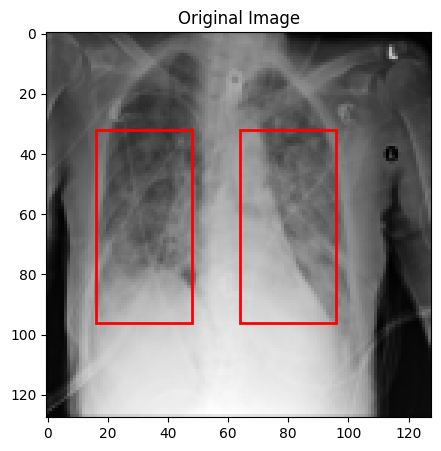

1/1 [==============================] - 0s 68ms/step
Percentage of area affected: 0.00%


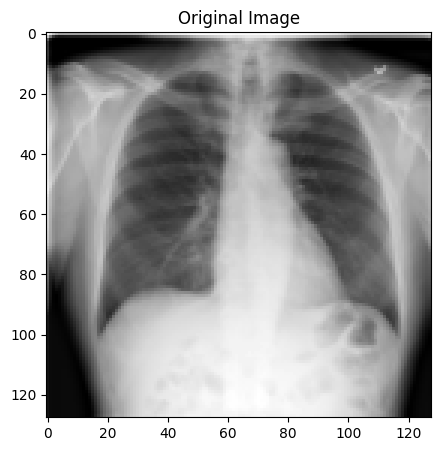

1/1 [==============================] - 0s 64ms/step
Percentage of area affected: 0.00%


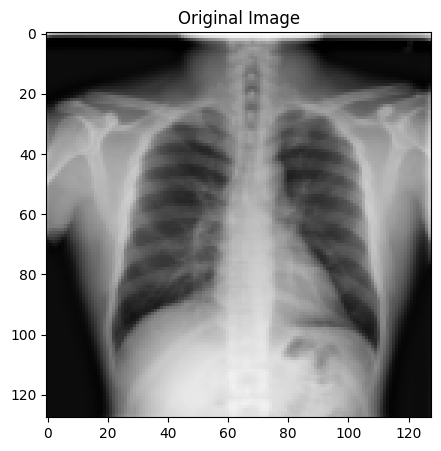

1/1 [==============================] - 0s 60ms/step
Percentage of area affected: 0.00%


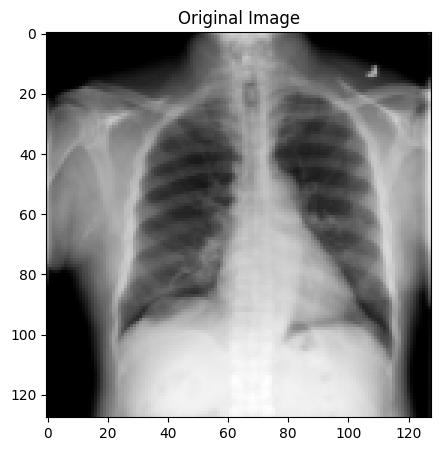

1/1 [==============================] - 0s 51ms/step
Percentage of area affected: 0.00%


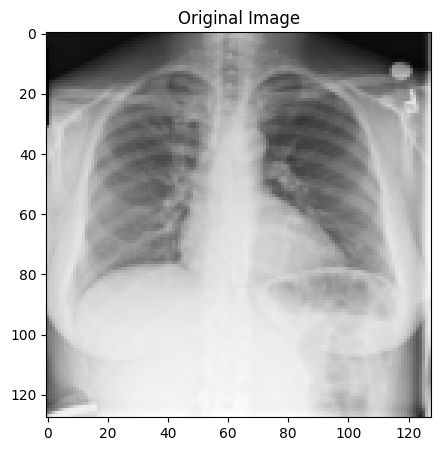

1/1 [==============================] - 0s 63ms/step
Percentage of area affected: 0.00%


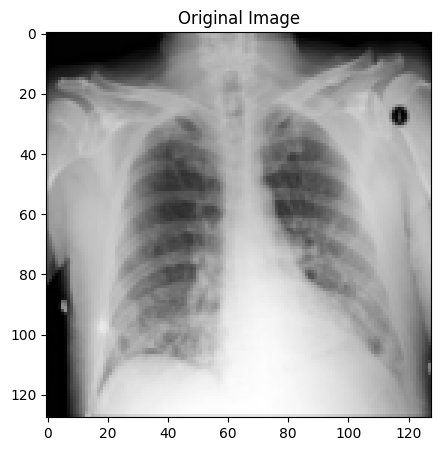

1/1 [==============================] - 0s 69ms/step
Percentage of area affected: 0.00%


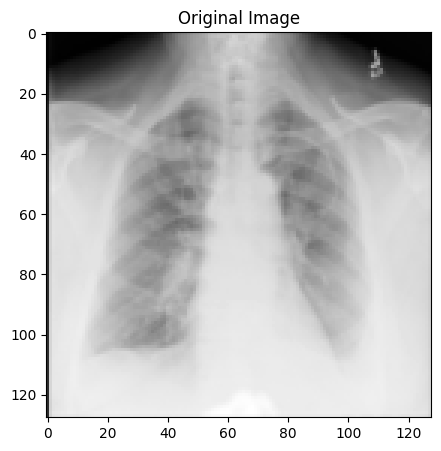

1/1 [==============================] - 0s 81ms/step
Percentage of area affected: 0.00%


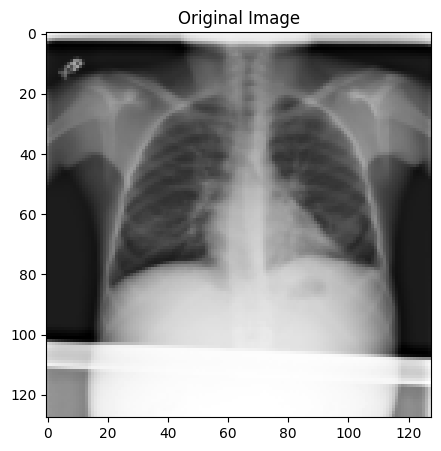

1/1 [==============================] - 0s 64ms/step
Percentage of area affected: 0.00%


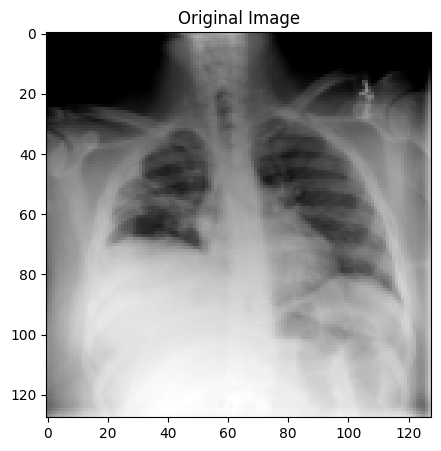

1/1 [==============================] - 0s 62ms/step
Coordinates: x=80, y=32, x2=96, y2=80
Percentage of area affected: 4.69%


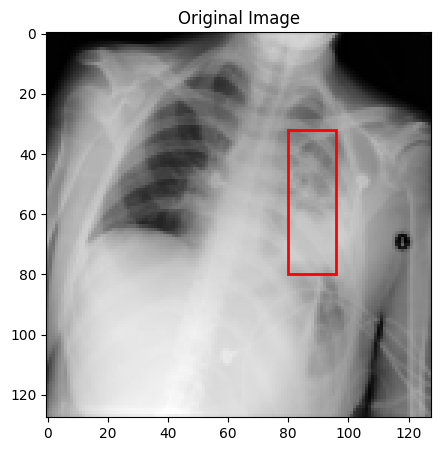

1/1 [==============================] - 0s 69ms/step
Percentage of area affected: 0.00%


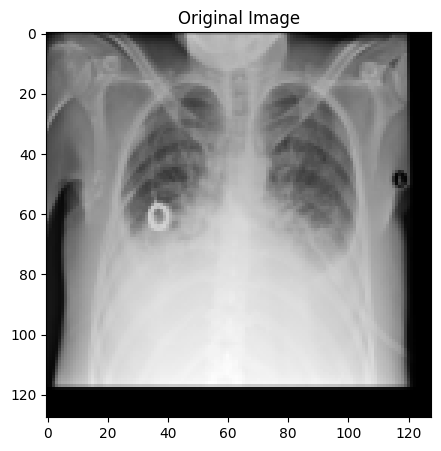

1/1 [==============================] - 0s 51ms/step
Percentage of area affected: 0.00%


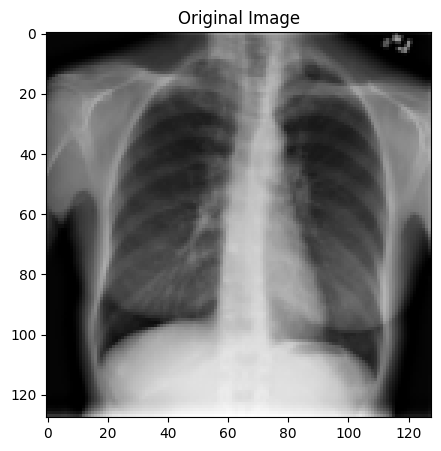

1/1 [==============================] - 0s 70ms/step
Percentage of area affected: 0.00%


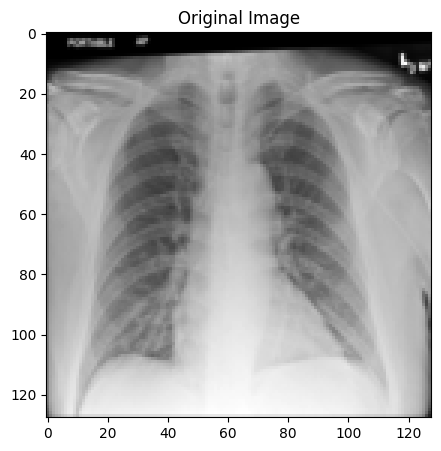

1/1 [==============================] - 0s 68ms/step
Percentage of area affected: 0.00%


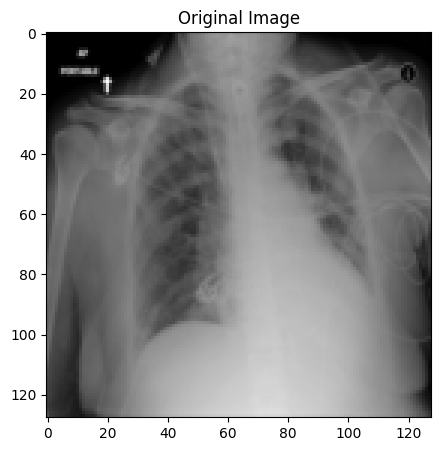

1/1 [==============================] - 0s 67ms/step
Percentage of area affected: 0.00%


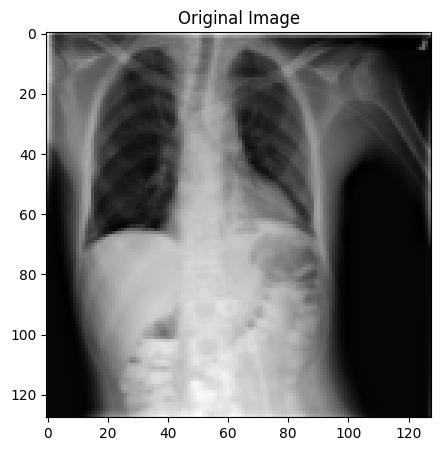

1/1 [==============================] - 0s 70ms/step
Percentage of area affected: 0.00%


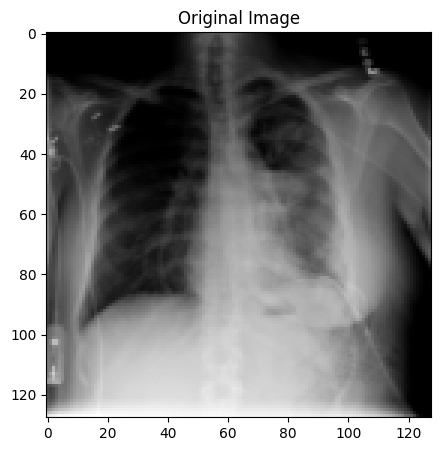

1/1 [==============================] - 0s 63ms/step
Coordinates: x=80, y=32, x2=96, y2=80
Percentage of area affected: 4.69%


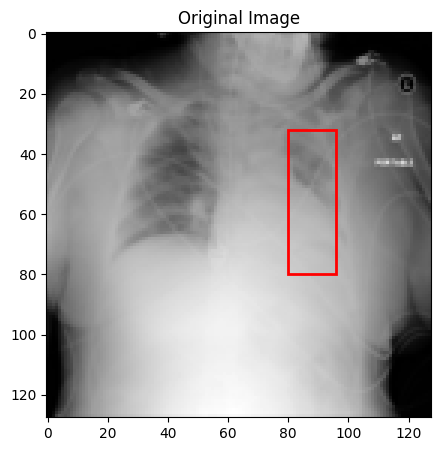

1/1 [==============================] - 0s 79ms/step
Percentage of area affected: 0.00%


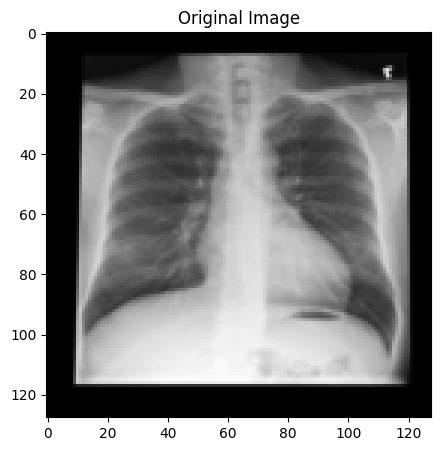

1/1 [==============================] - 0s 63ms/step
Percentage of area affected: 0.00%


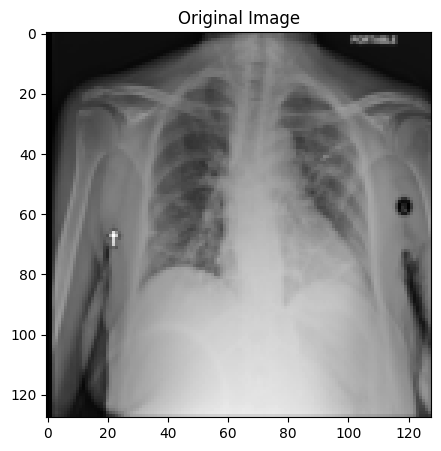

1/1 [==============================] - 0s 62ms/step
Percentage of area affected: 0.00%


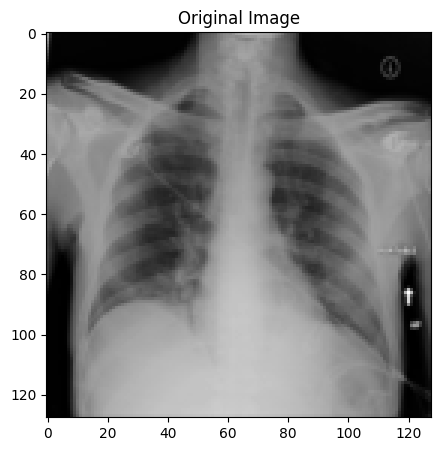

1/1 [==============================] - 0s 64ms/step
Coordinates: x=80, y=80, x2=96, y2=96
Percentage of area affected: 1.56%


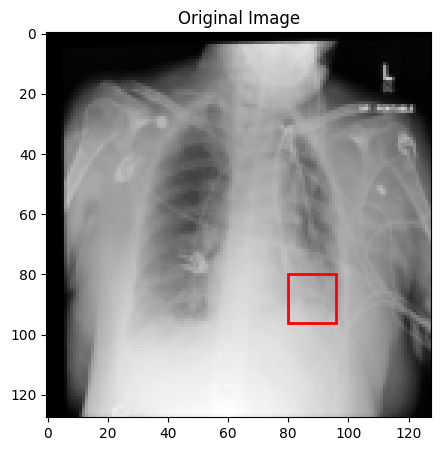

1/1 [==============================] - 0s 55ms/step
Percentage of area affected: 0.00%


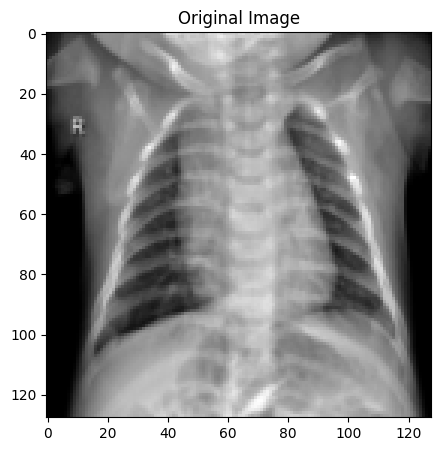

1/1 [==============================] - 0s 66ms/step
Percentage of area affected: 0.00%


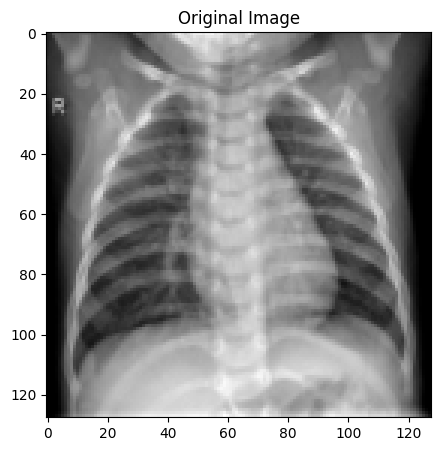

1/1 [==============================] - 0s 58ms/step
Coordinates: x=16, y=16, x2=48, y2=96
Coordinates: x=80, y=32, x2=96, y2=64
Percentage of area affected: 18.75%


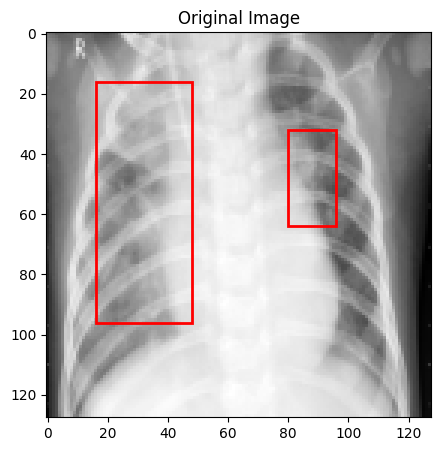

1/1 [==============================] - 0s 52ms/step
Coordinates: x=32, y=16, x2=48, y2=80
Coordinates: x=64, y=32, x2=112, y2=96
Percentage of area affected: 25.00%


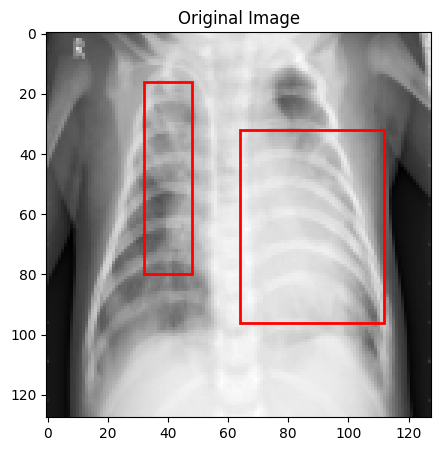

In [118]:
# Process and predict on each image
for image_file in image_files:
    # Load and preprocess the image
    image_path = os.path.join(data_folder, image_file)
    img = load_and_preprocess_image(image_path)
    
    # Predict on the image
    pred = model.predict(img)
    
    # Create a plot
    f, ax = plt.subplots(figsize=(5, 5))
    
    # Display the original image
    ax.imshow(img[0, :, :, 0], cmap='gray')
    ax.set_title("Original Image")
    
    # Apply threshold
    pred_mask = pred[0, :, :, 0] > 0.5
    
    # Apply connected components and bounding boxes on the original image
    comp = measure.label(pred_mask)
    total_area = 0
    img_area = img.shape[1] * img.shape[2]
    for region in measure.regionprops(comp):
        y, x, y2, x2 = region.bbox
        height = y2 - y
        width = x2 - x
        area = height * width
        total_area += area
        print(f"Coordinates: x={x}, y={y}, x2={x2}, y2={y2}")
        ax.add_patch(patches.Rectangle((x, y), width, height, linewidth=2, edgecolor='r', facecolor='none'))
    
    affected_percentage = (total_area / img_area) * 100
    print(f"Percentage of area affected: {affected_percentage:.2f}%")
    plt.show()

# Thanks